In [1]:
# --- DataFrame general settings  ---


import pandas as pd
import numpy as np
import re
import seaborn as sns
import matplotlib.pyplot as plt
import shark_functions as sf



# Load the Excel file
url = "https://www.sharkattackfile.net/spreadsheets/GSAF5.xls"
sharks = pd.read_excel(url, engine='xlrd')

#View all columns and rows
pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)

# Standardize column names by removing spaces and converting to lowercase
sharks.columns = [col.replace(' ', '').lower() for col in sharks.columns]

#Remove duplicate rows
sharks = sharks.drop_duplicates()

#Drop unused columns
sharks = sharks.drop(columns=['source', 'pdf', 'hrefformula', 'href', 'casenumber', 'casenumber.1','originalorder', 'unnamed:21', 'unnamed:22', 'unnamed:11'])

# --- Date ---

#remove useless words like "Reported", "Early", "Late" etc,
sharks.loc[:, 'date'] = sharks['date'].str.replace("Reported", "", regex=False)
sharks.loc[:, 'date'] = sharks['date'].str.replace("Early", "", regex=False)
sharks.loc[:, 'date'] = sharks['date'].str.replace("Late", "", regex=False)
sharks.loc[:, 'date'] = sharks['date'].str.replace("Between", "", regex=False)
sharks.loc[:, 'date'] = sharks['date'].str.replace("&", "", regex=False)
sharks.loc[:, 'date'] = sharks['date'].str.replace("- ", "-", regex=False)
sharks.loc[:, 'date'] = sharks['date'].str.replace("--", "-", regex=False)
sharks.loc[:, 'date'] = sharks['date'].str.replace("`", "-", regex=False)
sharks.loc[:, 'date'] = sharks['date'].str.replace("Nox", "Nov", regex=False)
sharks.loc[:, 'date'] = sharks['date'].str.replace(".", "", regex=False)
sharks.loc[:, 'date'] = sharks['date'].str.replace("Reportd", "", regex=False)
sharks.loc[:, 'date'] = sharks['date'].str.replace("Mid-", "", regex=False)
sharks.loc[:, 'date'] = sharks['date'].str.replace("(probably happened Ca 1843/1844)", "", regex=False)
sharks.loc[:, 'date'] = sharks['date'].str.replace("Ca", "", regex=False)
sharks.loc[:, 'date'] = sharks['date'].str.replace("or", "", regex=False)
sharks.loc[:, 'date'] = sharks['date'].str.replace("Summer of", "", regex=False)



[nltk_data] Downloading package punkt to
[nltk_data]     /Users/annapisarek/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/annapisarek/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
sf.clean_date_column(sharks)

,date,year,type,country,state,location,activity,name,sex,age,injury,time,species
0,2024-03-15,2024.0,Unprovoked,AUSTRALIA,Queensland,Bargara Beach,Swimming,Brooklyn Sauer,F,13,"Minor injuries to back, abdomen and legs",16h00,Tiger shark
1,2024-03-04,2024.0,Unprovoked,USA,Hawaii,"Old Man's, Waikiki",Surfing,Matthew White,M,NaN,"No injury, shark bit surfboard",NaN,Tiger shark 8'
2,2024-03-02,2024.0,Unprovoked,USA,Hawaii,"Rainbows, Oahu",Swimming,NaN,F,11,Lacerations to left foot,13h30,3' to 4' shark
3,2024-02-25,2024.0,Unprovoked,AUSTRALIA,Western Australia,"Sandlnd Island, Jurian Bay",NaN,female,F,46,Leg bitten,11h30,Tiger shark
4,2024-02-14,2024.0,Unprovoked,INDIA,Maharashtra,"Vaitarna River, Palghar District",Fishing,Vicky Suresh Govari,M,32,Calf of lower left leg injured,NaN,"Bull shark, 7'"
5,2024-02-04,2024.0,Provoked,TRINIDAD,NaN,NaN,Spearfishing,male,M,NaN,Shoulder bitten,06h30,Blacktip reef shark
6,2024-01-29,2024.0,Unprovoked,AUSTRALIA,New South Wales,"Elizabeth Bay, Sydney Harbor",Swimming,Lauren O'Neill,F,29,Right leg bitten,20h00,Bull shark
7,2024-01-15,2024.0,Unprovoked,BAHAMAS,Paradise Island,Paradise Island Resort,Swimming,male,M,10,Right leg injured,16h00,NaN
8,2024-01-09,2024.0,Unprovoked,AUSTRALIA,South Australia,"Walkers Beach, Elliston",Surfing,Murray Adams,M,64,Leg bitten,13h00,White shark
9,2024-01-05,2024.0,Provoked,SOUTH AFRICA,Eastern Cape Province,Papiesfontein,Fishing,male,M,62,Provoked incident. Lacerations and puncture wo...,NaN,Raggedtooth shark


In [3]:
# --- Country ---

sf.clean_country_column(sharks)

,date,year,type,country,state,location,activity,name,sex,age,injury,time,species
0,2024-03-15,2024.0,Unprovoked,AUSTRALIA,Queensland,Bargara Beach,Swimming,Brooklyn Sauer,F,13,"Minor injuries to back, abdomen and legs",16h00,Tiger shark
1,2024-03-04,2024.0,Unprovoked,USA,Hawaii,"Old Man's, Waikiki",Surfing,Matthew White,M,NaN,"No injury, shark bit surfboard",NaN,Tiger shark 8'
2,2024-03-02,2024.0,Unprovoked,USA,Hawaii,"Rainbows, Oahu",Swimming,NaN,F,11,Lacerations to left foot,13h30,3' to 4' shark
3,2024-02-25,2024.0,Unprovoked,AUSTRALIA,Western Australia,"Sandlnd Island, Jurian Bay",NaN,female,F,46,Leg bitten,11h30,Tiger shark
4,2024-02-14,2024.0,Unprovoked,INDIA,Maharashtra,"Vaitarna River, Palghar District",Fishing,Vicky Suresh Govari,M,32,Calf of lower left leg injured,NaN,"Bull shark, 7'"
5,2024-02-04,2024.0,Provoked,TRINIDAD,NaN,NaN,Spearfishing,male,M,NaN,Shoulder bitten,06h30,Blacktip reef shark
6,2024-01-29,2024.0,Unprovoked,AUSTRALIA,New South Wales,"Elizabeth Bay, Sydney Harbor",Swimming,Lauren O'Neill,F,29,Right leg bitten,20h00,Bull shark
7,2024-01-15,2024.0,Unprovoked,BAHAMAS,Paradise Island,Paradise Island Resort,Swimming,male,M,10,Right leg injured,16h00,NaN
8,2024-01-09,2024.0,Unprovoked,AUSTRALIA,South Australia,"Walkers Beach, Elliston",Surfing,Murray Adams,M,64,Leg bitten,13h00,White shark
9,2024-01-05,2024.0,Provoked,SOUTH AFRICA,Eastern Cape Province,Papiesfontein,Fishing,male,M,62,Provoked incident. Lacerations and puncture wo...,NaN,Raggedtooth shark


In [4]:
# Replace specific country names with standardized versions using .loc[] to avoid warnings
sharks.loc[:, 'country'] = sharks['country'].str.replace("ST HELENA", "SAINT HELENA", regex=False)
sharks.loc[:, 'country'] = sharks['country'].str.replace(" PHILIPPINES", "PHILIPPINES", regex=False)
sharks.loc[:, 'country'] = sharks['country'].str.replace("ENGLAND", "UNITED KINGDOM", regex=False)
sharks.loc[:, 'country'] = sharks['country'].str.replace("OKINAWA", "JAPAN", regex=False)
sharks.loc[:, 'country'] = sharks['country'].str.replace("AZORES", "PORTUGAL", regex=False)
sharks.loc[:, 'country'] = sharks['country'].str.replace("CEYLON", "SRI LANKA", regex=False)
sharks.loc[:, 'country'] = sharks['country'].str.replace("CRETE", "GREECE", regex=False)
sharks.loc[:, 'country'] = sharks['country'].str.replace(" TONGA", "TONGA", regex=False)
sharks.loc[:, 'country'] = sharks['country'].str.replace("&", "AND", regex=False)
sharks.loc[:, 'country'] = sharks['country'].str.replace("ST.", "ST", regex=False)
sharks.loc[:, 'country'] = sharks['country'].str.replace("SRI LANKA (SRI LANKA)", "SRI LANKA", regex=False)
sharks.loc[:, 'country'] = sharks['country'].str.replace("ST KITTS / NEVIS", "SAINT KITTS / NEVIS", regex=False)
sharks.loc[:, 'country'] = sharks['country'].str.replace("ST MAARTIN", "SAINT MAARTIN", regex=False)


/var/folders/7c/x67b6nwd1kbd8z85vpp7nrw80000gn/T/ipykernel_51916/993542069.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  sharks.loc[:, 'age'] = sharks['age'].astype(str).str.replace(r'[^\d]', '', regex=True).replace('', np.nan).astype(float)
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/annapisarek/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/annapisarek/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
/opt/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.w

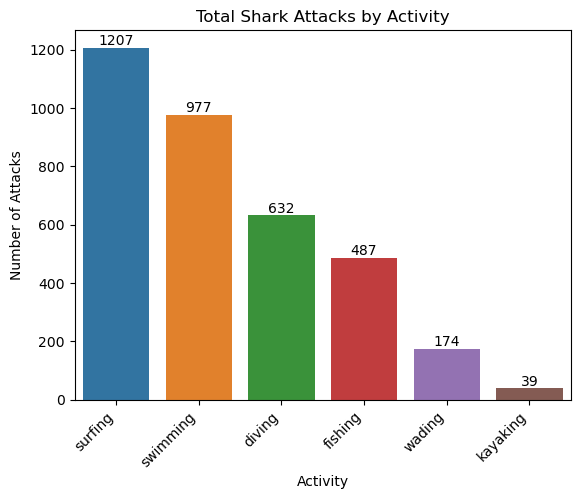

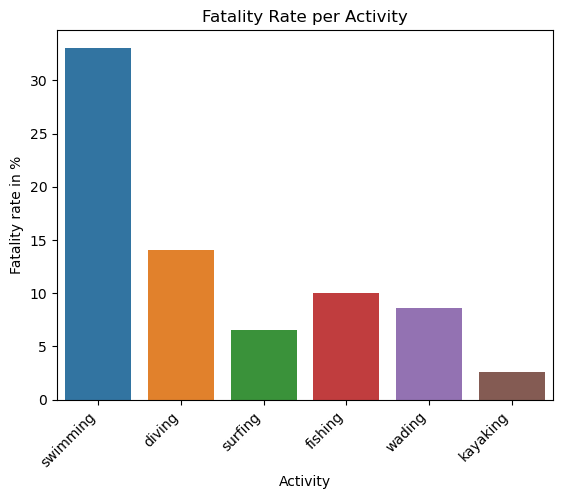

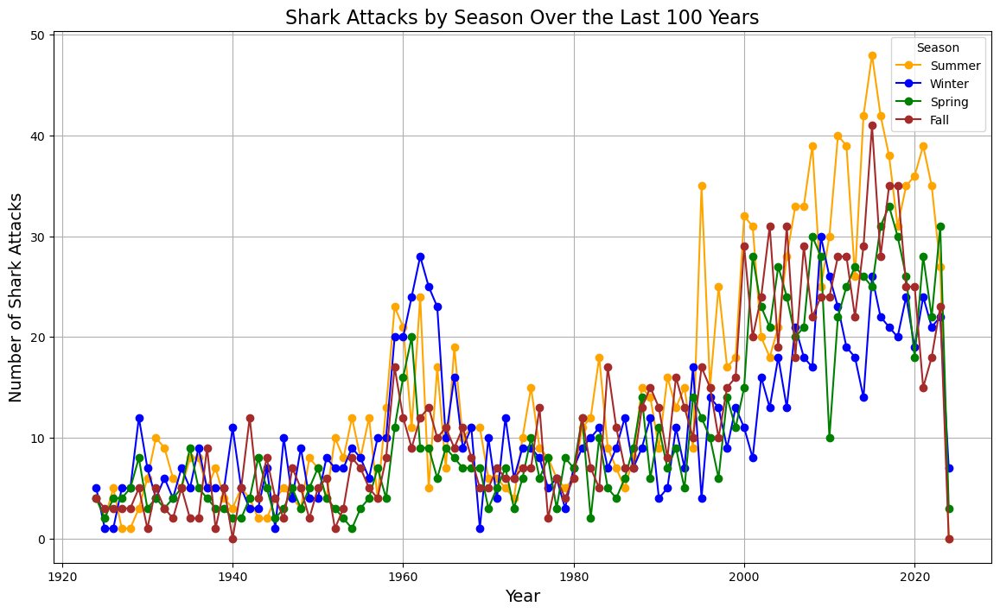

Summer had the most attacks in 34 out of 101 years in the last 100 years.


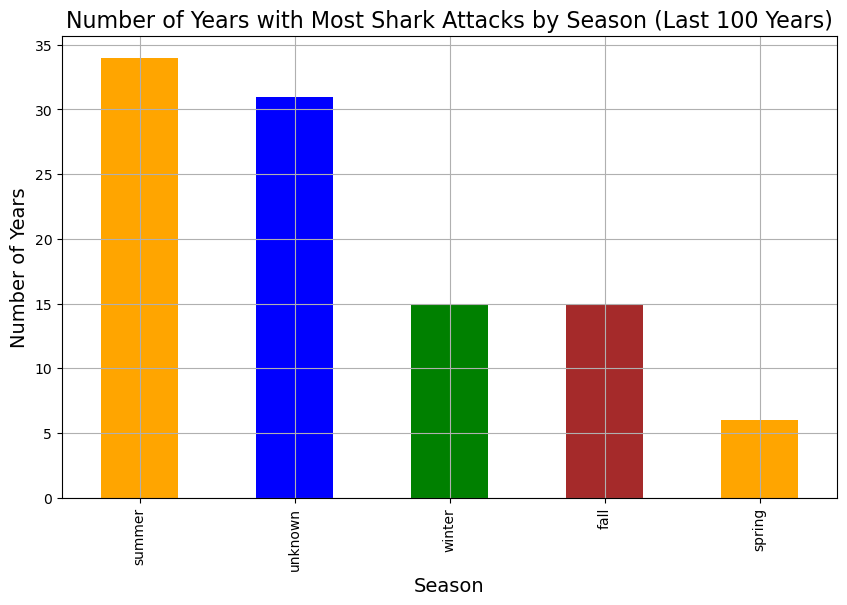

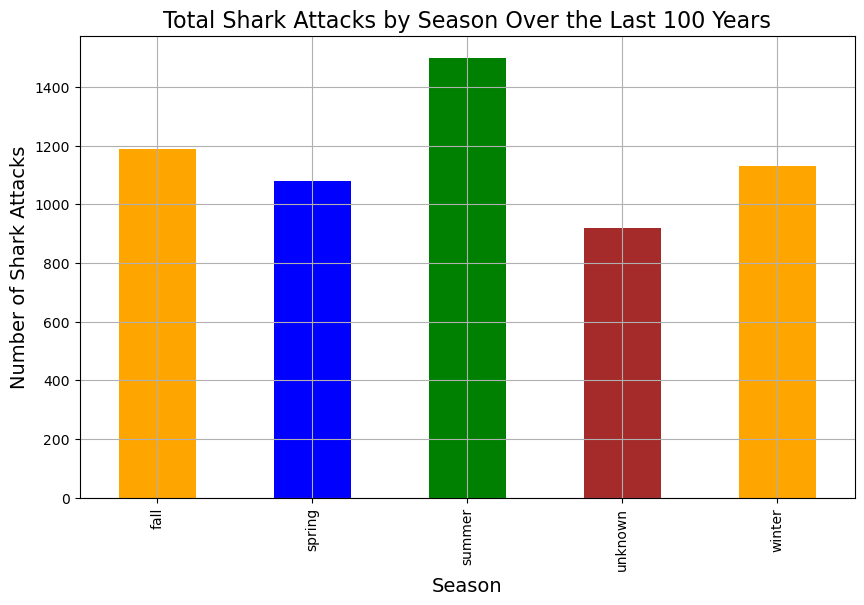


Statistics for woman:
Total valid woman qty: 779
woman_injury_qty: 655
woman_injury_rate: 84.08%
woman_fatal_qty: 118
woman_fatal_rate: 15.15%
woman_total_safe_qty: 6
woman_total_safe_rate: 0.77%


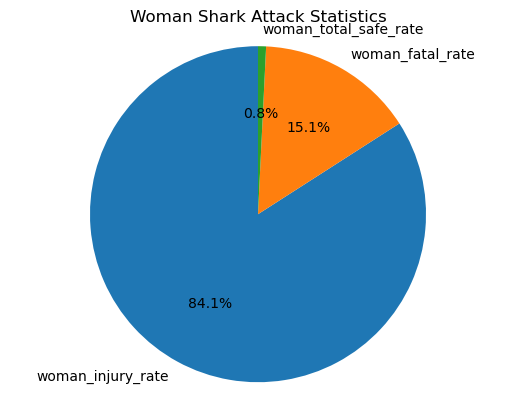


Statistics for man:
Total valid man qty: 5581
man_injury_qty: 4278
man_injury_rate: 76.65%
man_fatal_qty: 1224
man_fatal_rate: 21.93%
man_total_safe_qty: 79
man_total_safe_rate: 1.42%


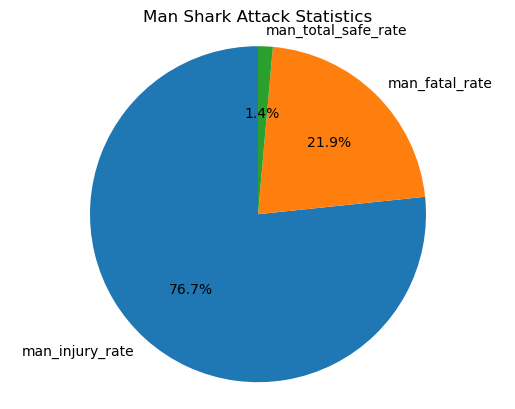

In [17]:


# --- Age ---
#remove non numeric
sharks.loc[:, 'age'] = sharks['age'].astype(str).str.replace(r'[^\d]', '', regex=True).replace('', np.nan).astype(float)


# Remove values that are higher than 100 or lower than 0 using .loc
sharks.loc[:, 'age'] = sharks['age'].where((sharks['age'] >= 0) & (sharks['age'] <= 100))

# --- Sex ---

# deal with sex column to only left valid M/F/Nan value and remove outlier values rows
# Remove whitespace from the 'sex' column using .loc
sharks.loc[:, 'sex'] = sharks['sex'].str.replace(' ', '')

# Filter out specific invalid values in the 'sex' column using .loc
sharks = sharks.loc[~sharks['sex'].isin(['N', 'lli', 'Mx2', '.'])]

# --- Injury ---

sharks.loc[:, 'injury'] = sharks['injury'].str.replace(r'.*FATAL.*', 'FATAL', regex=True)
sharks.loc[:, 'injury']  = sharks['injury'].str.replace(r'.*fatal.*', 'FATAL', regex=True)

# --- Activity ---

#Apply clustering to simplify activities

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize


# Step 1: Download necessary NLTK data
nltk.download('punkt')
nltk.download('stopwords')


# Step 2: Preprocess the activity

processed_activity = sharks['activity'].apply(sf.preprocess)

# Step 3: Vectorize the processed activity
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(processed_activity)

# Step 4: Perform K-means clustering
n_clusters = min(20, len(sharks))  # Adjust this number based on your needs, but not more than the number of rows
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(X)

# Step 5: Assign a representative activity to each cluster
# Create a dictionary mapping cluster numbers to simplified activity
cluster_to_activity = {}
for cluster in range(n_clusters):
    if cluster in clusters:
        cluster_to_activity[cluster] = sf.get_cluster_label(cluster, sharks, clusters)
    else:
        cluster_to_activity[cluster] = "Uncategorized"

# Add the simplified activity to the sharks dataframe
sharks['simplified_activity'] = [cluster_to_activity[cluster] for cluster in clusters]

"""
# Optional: Print out the clusters and their activity
for cluster in range(n_clusters):
    print(f"\nCluster {cluster}:")
    cluster_activity = sharks[clusters == cluster]['activity']
    if cluster_activity.empty:
        print("No activity in this cluster")
    else:
        print(cluster_activity.head())
"""
mapping = {
    'Foil Boarding': 'surfing',
    'Surfing': 'surfing',
    'Swimming': 'swimming',
    'Fishing': 'fishing',
    'Spearfishing': 'diving',
    'Diving for crayfish': 'diving',
    'Wading': 'wading',
    'Night bathing': 'swimming',
    'Scuba diving': 'diving',
    'Snorkeling': 'diving',
    'Standing': 'other',
    'Body boarding': 'surfing',
    'Jumped into water': 'playing in water',
    'Free diving': 'diving',
    'Paddle boarding': 'surfing',
    'Surf skiing': 'surfing',
    'Kayaking': 'kayaking',
    'Playing in the water': 'playing in water',
    'Spearfishing & diving for paua': 'diving',
    'unknown': 'other'
}
sharks['simplified_activity'] = sharks['activity'].map(mapping)
sharks.loc[:, 'simplified_activity'] = sharks['simplified_activity'].fillna('other')

# --- Hypothesis 1: Surfing is the most dangerous activity and surfers should pay more for the insurance ---

total_attacks = sharks['simplified_activity'].value_counts()
total_attacks = total_attacks[total_attacks.index != 'other']
total_attacks = total_attacks[total_attacks.index != 'playing in water']

#Display total attacks graph

total_attacks_graph = sns.barplot(x=total_attacks.index, y=total_attacks.values)

total_attacks_graph.set(xlabel="Activity", ylabel="Number of Attacks", title="Total Shark Attacks by Activity")

plt.xticks(rotation=45, ha='right')

for index, value in enumerate(total_attacks.values):
    total_attacks_graph.text(index, value, str(value), ha='center', va='bottom')

plt.show()



# --- Fatality rate by activity ---
only_fatal = sharks[sharks["injury"]=="FATAL"]

fatal_attacks = only_fatal['simplified_activity'].value_counts()
fatal_attacks = fatal_attacks[fatal_attacks.index != 'other']
fatal_attacks = fatal_attacks[fatal_attacks.index != 'playing in water']

# Total attacks per activity
total_attacks = sharks['simplified_activity'].value_counts()

# Calculate fatality rate
fatality_rate = round((fatal_attacks / total_attacks[fatal_attacks.index]) * 100, 2)
sharks["fatality_rate"] = fatality_rate

# Display fatality rate graph
fatal_attacks_graph = sns.barplot(x=fatal_attacks.index, y=fatality_rate)

fatal_attacks_graph.set(xlabel="Activity", ylabel="Fatality rate in %", title="Fatality Rate per Activity")
fatal_attacks_graph.set_xticklabels(fatal_attacks.index, rotation=45, ha='right')

plt.show()




# Hypothesis: 2- Are shark attacks more frequent in summer compared to other seasons?---



sharks['date'] = pd.to_datetime(sharks['date'], errors='coerce')
# Function to assign seasons based on the months


if 'year' not in sharks.columns:
    sharks['year'] = sharks['date'].dt.year
    
from shark_functions import assign_season

# Add a new 'season' column based on the date
sharks['season'] = sharks['date'].apply(lambda x: assign_season(x) if pd.notnull(x) else 'unknown')

# Filter Data for the Last 100 Years
current_year = pd.Timestamp.now().year
last_100_years = sharks[sharks['year'] >= (current_year - 100)]

# Group Data by Year and Season
# Count the number of attacks per year for each season
seasonal_attacks = last_100_years.groupby(['year', 'season']).size().unstack(fill_value=0)

# Flatten the years index if it's multi-dimensional
years = seasonal_attacks.index.get_level_values(0).to_numpy()

# Visualization
plt.figure(figsize=(14, 8))

# Plot the yearly attacks for each season
plt.plot(years, seasonal_attacks['summer'].values, label='Summer', color='orange', marker='o')
plt.plot(years, seasonal_attacks['winter'].values, label='Winter', color='blue', marker='o')
plt.plot(years, seasonal_attacks['spring'].values, label='Spring', color='green', marker='o')
plt.plot(years, seasonal_attacks['fall'].values, label='Fall', color='brown', marker='o')

# Labels and title
plt.title('Shark Attacks by Season Over the Last 100 Years', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Number of Shark Attacks', fontsize=14)

# Add a legend
plt.legend(title='Season')

# Show the plot
plt.grid(True)
plt.show()

# Group the data by year and season, and count the number of attacks
seasonal_attacks = last_100_years.groupby(['year', 'season']).size().unstack(fill_value=0)

# Find which season had the most attacks each year
most_attacks_per_year = seasonal_attacks.idxmax(axis=1)

# Count how many times summer had the most attacks
summer_dominant_years = (most_attacks_per_year == 'summer').sum()

# Total number of years in the last 100 years
total_years = len(seasonal_attacks)

# Output the result
print(f"Summer had the most attacks in {summer_dominant_years} out of {total_years} years in the last 100 years.")

# Optional: visualize the result with a bar chart
plt.figure(figsize=(10, 6))
most_attacks_per_year.value_counts().plot(kind='bar', color=['orange', 'blue', 'green', 'brown'])
plt.title('Number of Years with Most Shark Attacks by Season (Last 100 Years)', fontsize=16)
plt.xlabel('Season', fontsize=14)
plt.ylabel('Number of Years', fontsize=14)
plt.grid(True)
plt.show()


# Sum total number of attacks for each season
season_totals = seasonal_attacks.sum()

# Create a bar plot
plt.figure(figsize=(10, 6))
season_totals.plot(kind='bar', color=['orange', 'blue', 'green', 'brown'])

# Add title and labels
plt.title('Total Shark Attacks by Season Over the Last 100 Years', fontsize=16)
plt.xlabel('Season', fontsize=14)
plt.ylabel('Number of Shark Attacks', fontsize=14)

# Show plot
plt.grid(True)
plt.show()



# Hypothesis: 3 - Men are more likely to be attacked---

sharks["injury"] = sharks["injury"].astype(str).str.strip().str.lower()


from shark_functions import calculate_rates 
# Calculate rates for women and men
woman_data = calculate_rates(sharks,'F')
man_data = calculate_rates(sharks,'M')

# Print statistics
for sex, data in [("woman", woman_data), ("man", man_data)]:
    total, fatal, injury, no_injury, fatal_rate, injury_rate, safe_rate = data
    print(f"\nStatistics for {sex}:")
    print(f"Total valid {sex} qty: {total}")
    print(f"{sex}_injury_qty: {injury}")
    print(f"{sex}_injury_rate: {injury_rate:.2f}%")
    print(f"{sex}_fatal_qty: {fatal}")
    print(f"{sex}_fatal_rate: {fatal_rate:.2f}%")
    print(f"{sex}_total_safe_qty: {no_injury}")
    print(f"{sex}_total_safe_rate: {safe_rate:.2f}%")
    
    # Create pie chart
    labels = [f'{sex}_injury_rate', f'{sex}_fatal_rate', f'{sex}_total_safe_rate']
    sizes = [injury_rate, fatal_rate, safe_rate]
    plt.figure()
    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
    plt.axis('equal')
    plt.title(f'{sex.capitalize()} Shark Attack Statistics')
    plt.show()

